In [4]:
import networkx
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.colors as colors
import matplotlib.cm as cmx
from sklearn.metrics import r2_score
import cylouvain
import igraph as ig
import os
sns.set()
%matplotlib inline

In [5]:
graph = nx.read_gml('network.gml')

# Network Summary
* Network source
* Node attributes
* size, order

In [6]:
print 'Size', graph.size()
print 'Order', graph.order()

Size 1002
Order 225


# Visualizaiton

In [7]:
if not os.path.exists('pics'):
    os.mkdir('pics')

In [8]:
def get_labels(graph):
    return nx.get_node_attributes(graph, 'first_name')

In [9]:
GRAPH_PLOT_SIZE = (20, 13)
SMALL_GRAPH_PLOT_SIZE = (10, 10)
PLOT_SIZE=(10, 7)
PLOT_SIZE_WIDE=(15, 7)
PLOT_SIZE_LARGE=(15, 15)

/home/boris/anaconda3/envs/py2/lib/python2.7/site-packages/networkx/drawing/nx_pylab.py:511: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if not cb.is_string_like(edge_color) \
/home/boris/anaconda3/envs/py2/lib/python2.7/site-packages/networkx/drawing/nx_pylab.py:532: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if cb.is_string_like(edge_color) or len(edge_color) == 1:
/home/boris/anaconda3/envs/py2/lib/python2.7/site-packages/networkx/drawing/nx_pylab.py:712: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if not cb.is_string_like(label):


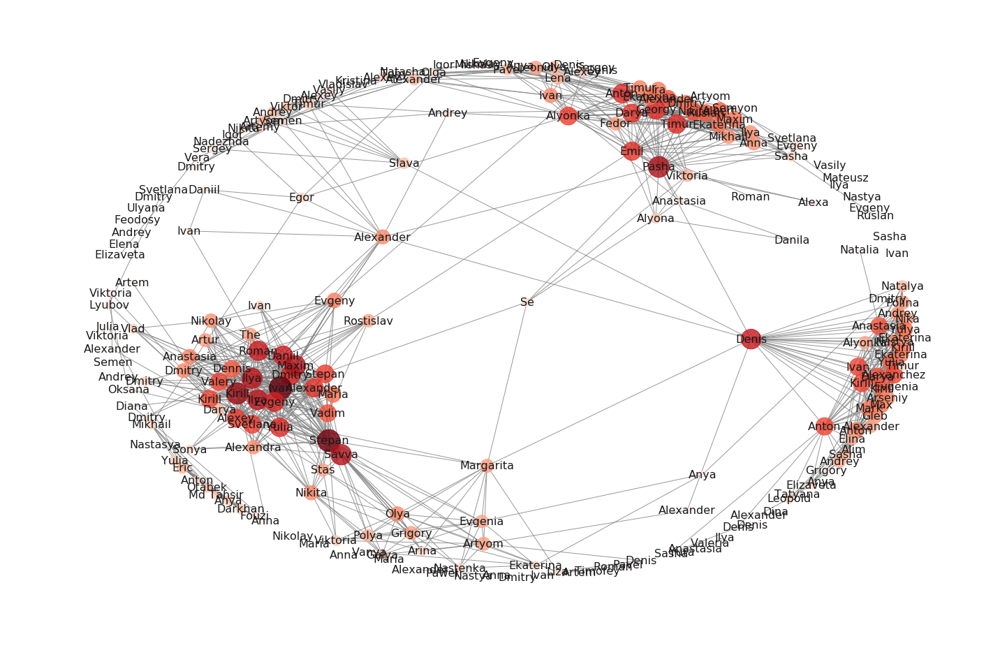

In [10]:
degree = nx.degree(graph)


subgraph = graph

degree = nx.degree(subgraph)
labels = get_labels(subgraph)

plt.figure(1, figsize=GRAPH_PLOT_SIZE)
plt.axis('off')
pos = nx.spring_layout(subgraph, k=1.5/np.sqrt(subgraph.order()))
nx.draw_networkx(subgraph,
                 pos=pos,
                 node_size = [d*30 for k, d in degree.items()],
                 node_color=degree.values(),
                 font_size=16,
                 cmap=plt.cm.Reds,
                 with_labels=True,
                 labels=labels,
                 edge_color='grey',
                 alpha=0.8)
plt.tight_layout()
plt.savefig('pics/layout.png')
plt.show()

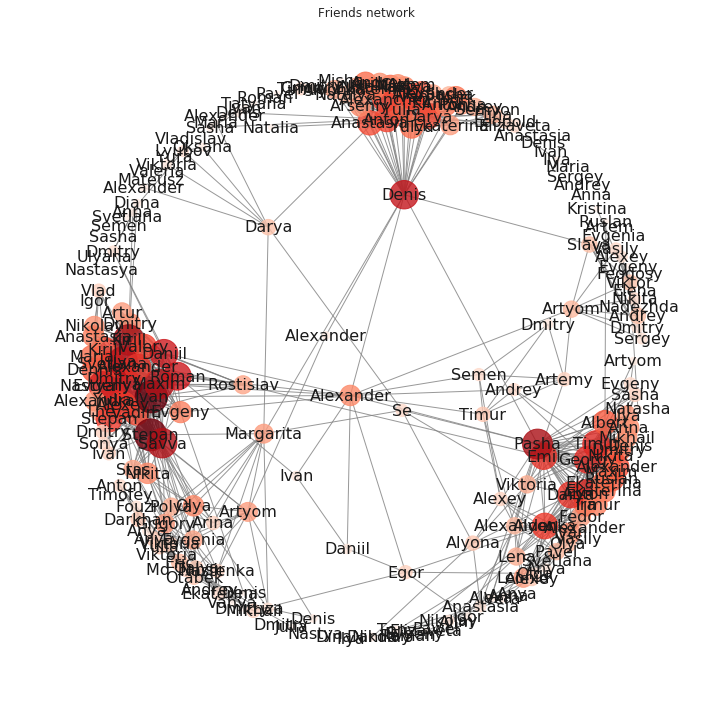

In [11]:
degree = nx.degree(graph)


subgraph = graph

degree = nx.degree(subgraph)
labels = get_labels(subgraph)

plt.figure(1, figsize=SMALL_GRAPH_PLOT_SIZE)
plt.axis('off')
pos = nx.spring_layout(subgraph, k=1.5/np.sqrt(subgraph.order()))
nx.draw_networkx(subgraph,
                 pos=pos,
                 node_size = [d*30 for k, d in degree.items()],
                 node_color=degree.values(),
                 font_size=16,
                 cmap=plt.cm.Reds,
                 with_labels=True,
                 labels=labels,
                 edge_color='grey',
                 alpha=0.8)
plt.tight_layout()
plt.title('Friends network')
plt.savefig('pics/layout_small.png')
plt.show()

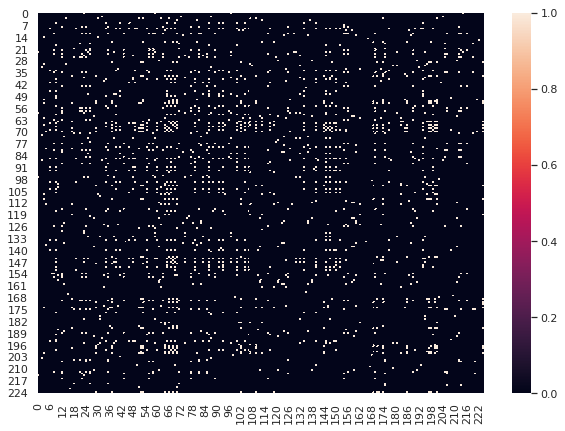

In [12]:
plt.figure(1, figsize=PLOT_SIZE)
sns.heatmap(nx.to_numpy_matrix(graph))
plt.show()

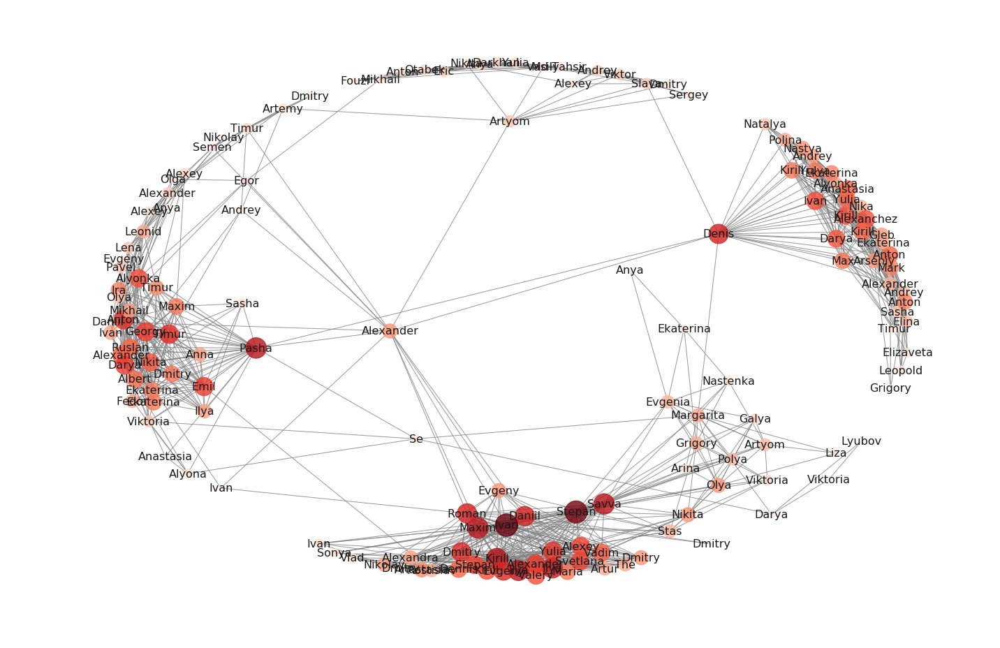

In [13]:
degree = nx.degree(graph)


filtered_nodes = [k for k, v in degree.items() if v > 2]
subgraph = nx.subgraph(graph, filtered_nodes)

degree = nx.degree(subgraph)
labels = get_labels(subgraph)

plt.figure(1, figsize=GRAPH_PLOT_SIZE)
plt.axis('off')
pos = nx.spring_layout(subgraph, k=1.5/np.sqrt(subgraph.order()))
nx.draw_networkx(subgraph,
                 pos=pos,
                 node_size = [d*30 for k, d in degree.items()],
                 node_color=degree.values(),
                 font_size=16,
                 cmap=plt.cm.Reds,
                 with_labels=True,
                 labels=labels,
                 edge_color='grey',
                 alpha=0.8)
plt.tight_layout()
plt.savefig('pics/layout_clean.png')
plt.show()

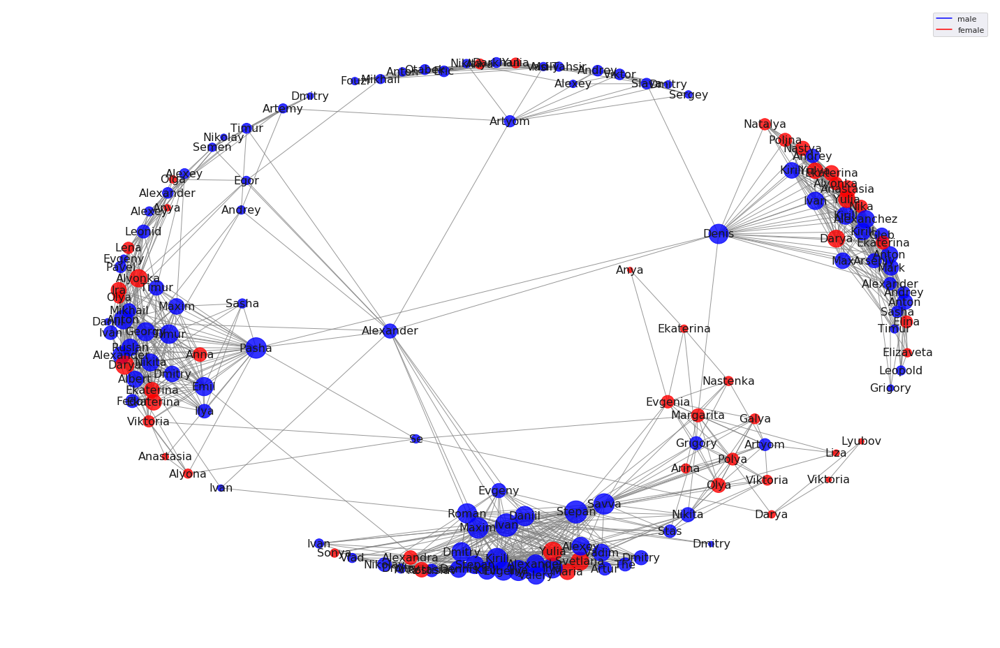

In [16]:
degree = nx.degree(graph)


filtered_nodes = [k for k, v in degree.items() if v > 2]
subgraph = nx.subgraph(graph, filtered_nodes)

degree = nx.degree(subgraph)
labels = get_labels(subgraph)
ncolors = nx.get_node_attributes(subgraph, 'sex')

sex_map = {
    0: 'yellow', #unspecified
    1: 'red', #female
    2: 'blue' # male
}

ncolors = [sex_map[c] for c in ncolors.values()]

plt.figure(1, figsize=GRAPH_PLOT_SIZE)
plt.axis('off')

plt.plot([0],[0], color='blue', label='male')
plt.plot([0],[0], color='red', label='female')
#plt.plot([0],[0], color='yellow', label='unspecified')

#pos = nx.spring_layout(subgraph, k=1.5/np.sqrt(subgraph.order()))
nx.draw_networkx(subgraph,
                 pos=pos,
                 node_size = [d*30 for k, d in degree.items()],
                 node_color=ncolors,
                 font_size=16,
                 cmap=plt.cm.Reds,
                 with_labels=True,
                 labels=labels,
                 edge_color='grey',
                 alpha=0.8)
plt.legend()
plt.tight_layout()
plt.savefig('pics/layout_sex.png')
plt.show()

In [17]:
# Investigate degree distribution
def degree_pdf(graph):
    degree = pd.Series(graph.degree())
    degree = degree.sort_values()
    vcounts = degree.value_counts()
    
    degree_keys = pd.Series(vcounts.index).sort_values().values
    s = vcounts.sum()
    pdf=(vcounts/s)[degree_keys]
    
    return degree_keys, pdf

def plot_pdf(graph):
    degree_keys, pdf = degree_pdf(graph)
    plt.plot(degree_keys, pdf,'r')
    plt.title('Node degree PDF')
    plt.xlabel('$k$')
    plt.ylabel('$p(k)$')

def degree_cdf(graph):
    degree_keys, pdf = degree_pdf(graph)
    cdf = pdf.cumsum()
    
    return degree_keys, cdf

def plot_cdf(graph):
    degree_keys, cdf = degree_cdf(graph)
    plt.plot(degree_keys, cdf,'r')
    plt.title('Node degree CDF')
    plt.xlabel('$k$')
    plt.ylabel('$cdf(k)$')
    
def fit_log_log(degree_vals):
    x_est = np.log(range(1, len(degree_vals)+1))
    y_est = np.log(degree_vals)
    s = len(x_est)

    X = np.vstack([np.ones(s), x_est]).T
    Beta = np.dot(np.dot(np.linalg.inv(np.dot(X.T, X)), X.T), y_est)

    a_linreg = -Beta[1]
    c_linreg = Beta[0]
    
    idx = np.argsort(x_est)
    yt = X[idx,:].dot(Beta)
    xt = X[idx,1]
    
    plt.plot(x_est, y_est, '.')
    plt.plot(xt, yt, '-')
    
    print 'R squared:', r2_score(yt, y_est)
    mse = (np.square(yt - y_est)).mean()
    print 'MSE', mse

    return a_linreg, c_linreg

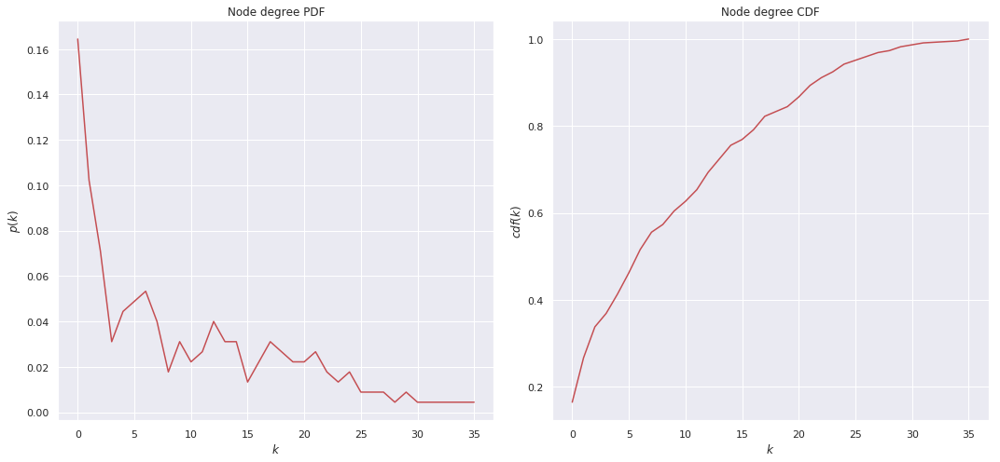

In [18]:
plt.figure(figsize=PLOT_SIZE_WIDE)
plt.subplot(1,2,1)
plot_pdf(graph)
plt.subplot(1,2,2)
plot_cdf(graph)
plt.tight_layout()
plt.savefig('pics/degree_dist.png')
plt.show()

Well this is some kind of powerlaw

R squared: 0.6720990005417096
MSE 0.20625090288200262


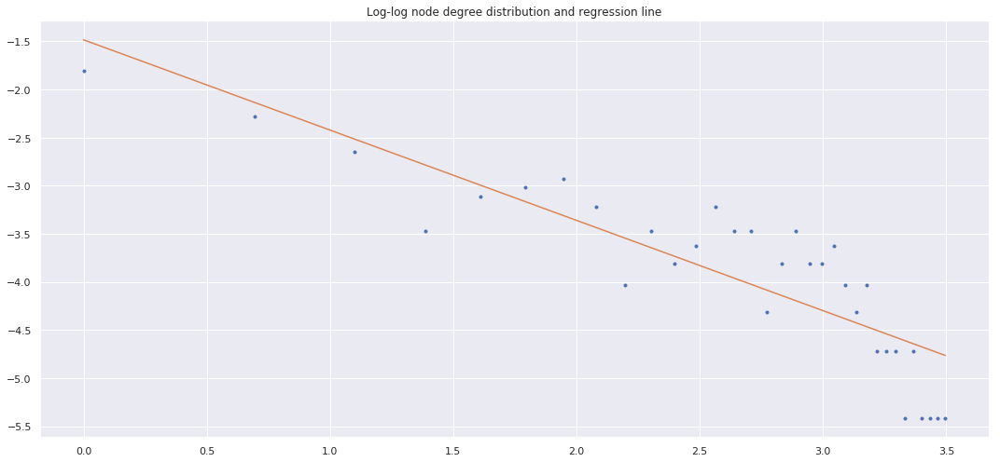

Estimated alpha 0.938271534501764
Estimated C -1.4832961591048317


In [19]:
degree_keys, pdf = degree_pdf(graph)
plt.figure(figsize=PLOT_SIZE_WIDE)
plt.title('Log-log node degree distribution and regression line')
alpha, C= fit_log_log(pdf)
plt.tight_layout()
plt.savefig('pics/degree_loglog.png')
plt.show()
print 'Estimated alpha', alpha
print 'Estimated C', C

In [20]:
comp = next(nx.connected_component_subgraphs(graph))
print 'Diameter', nx.diameter(comp)
print 'Clustering coefficient', nx.average_clustering(graph)

Diameter 9
Clustering coefficient 0.460743024603


# Structural analysis

In [21]:
def draw_centralities(graph, measures, pos=None, k_mult=1.5, size_mult=5000):    
    labels = get_labels(graph)
    
    plt.axis('off')
    pos = pos or nx.spring_layout(graph, k=k_mult/np.sqrt(graph.order()))
    nx.draw_networkx(graph,
                     pos=pos,
                     node_size = [d*size_mult for k, d in measures.items()],
                     node_color=measures.values(),
                     font_size=14,
                     cmap=plt.cm.Reds,
                     with_labels=True,
                     labels=labels,
                     edge_color='grey',
                     alpha=0.8)
    

In [22]:
pos = nx.spring_layout(subgraph, k=1.5/np.sqrt(subgraph.order()))

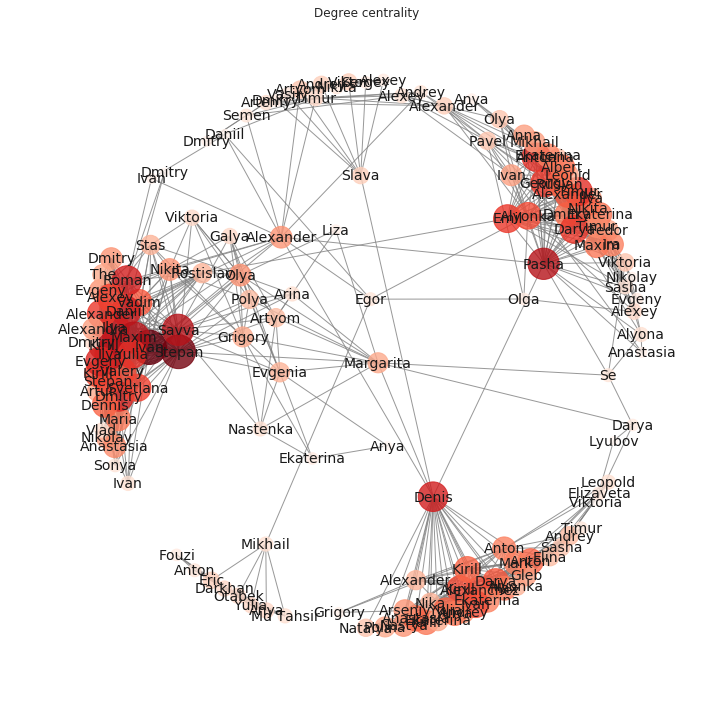

In [23]:
# Degree centrality
dc = nx.degree_centrality(subgraph)
plt.figure(1, figsize=SMALL_GRAPH_PLOT_SIZE)
draw_centralities(subgraph, dc, pos=pos)
plt.title('Degree centrality')
plt.tight_layout()
plt.savefig('pics/struct_dc.png')
plt.show()

In [24]:
def get_top_subgraph(graph, measures, quantile=0.5):
    dcs = pd.Series(measures)
    mask = dcs > dcs.quantile(quantile)
    nodes = pd.Series(subgraph.nodes())
    nodes.index = mask.index
    subgraph_nodes = nodes.ix[mask]
    subgraph_dcs = dcs.ix[mask]
    subgraph_top = nx.subgraph(graph, subgraph_nodes)
    
    subgraph_measures = {k:v for k,v in measures.items() if k in subgraph_nodes}
    return subgraph_top, subgraph_measures

/home/boris/anaconda3/envs/py2/lib/python2.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  
/home/boris/anaconda3/envs/py2/lib/python2.7/site-packages/ipykernel_launcher.py:7: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  import sys


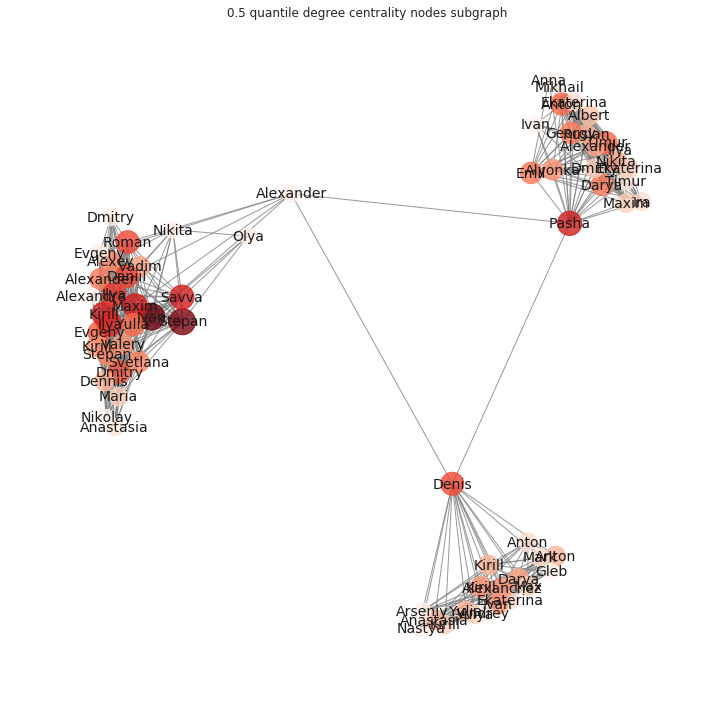

In [25]:
subgraph_top, sub_measures = get_top_subgraph(subgraph, dc)
plt.figure(1, figsize=SMALL_GRAPH_PLOT_SIZE)
draw_centralities(subgraph_top, sub_measures, k_mult=3, pos=pos, size_mult=3000)
plt.title('0.5 quantile degree centrality nodes subgraph')
plt.tight_layout()
plt.savefig('pics/struct_dc_top.png')
plt.show()

In [26]:
top = pd.Series(dc).nlargest(5)
top_nodes = np.array(top.index)
print 'Top 5 nodes'
for n in top_nodes:
    print labels[n], round(top[n], 4)

Top 5 nodes
Ivan 0.2365
Stepan 0.2297
Kirill 0.1959
Pasha 0.1959
Maxim 0.1959


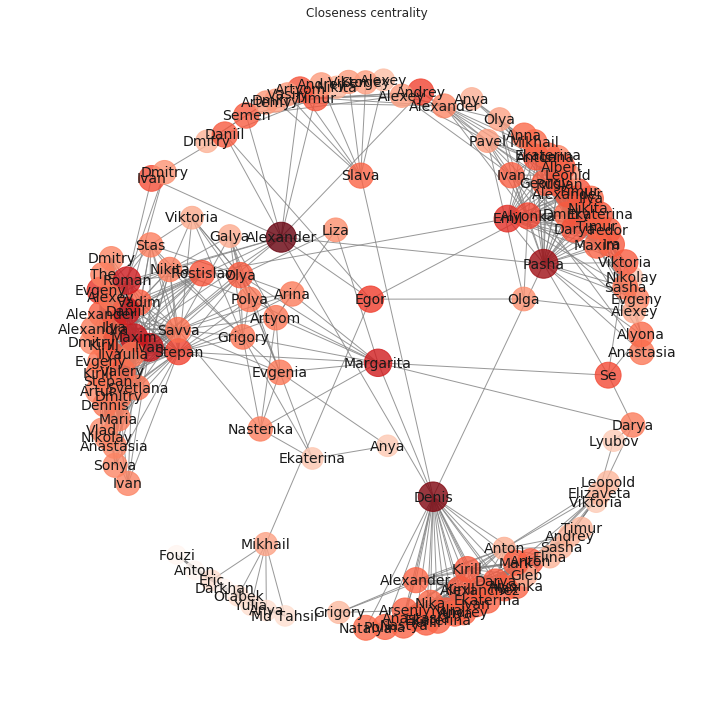

In [27]:
# Closeness centrality
cm = nx.closeness_centrality(subgraph)
plt.figure(1, figsize=SMALL_GRAPH_PLOT_SIZE)
draw_centralities(subgraph, cm, pos=pos, size_mult=2000)
plt.title('Closeness centrality')
plt.tight_layout()
plt.savefig('pics/struct_closeness.png')
plt.show()

In [28]:
top = pd.Series(cm).nlargest(5)
top_nodes = np.array(top.index)
print 'Top 5 nodes'
for n in top_nodes:
    print labels[n], round(top[n], 4)

Top 5 nodes
Alexander 0.4498
Denis 0.4353
Pasha 0.4181
Ivan 0.3885
Maxim 0.3814


/home/boris/anaconda3/envs/py2/lib/python2.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  
/home/boris/anaconda3/envs/py2/lib/python2.7/site-packages/ipykernel_launcher.py:7: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  import sys


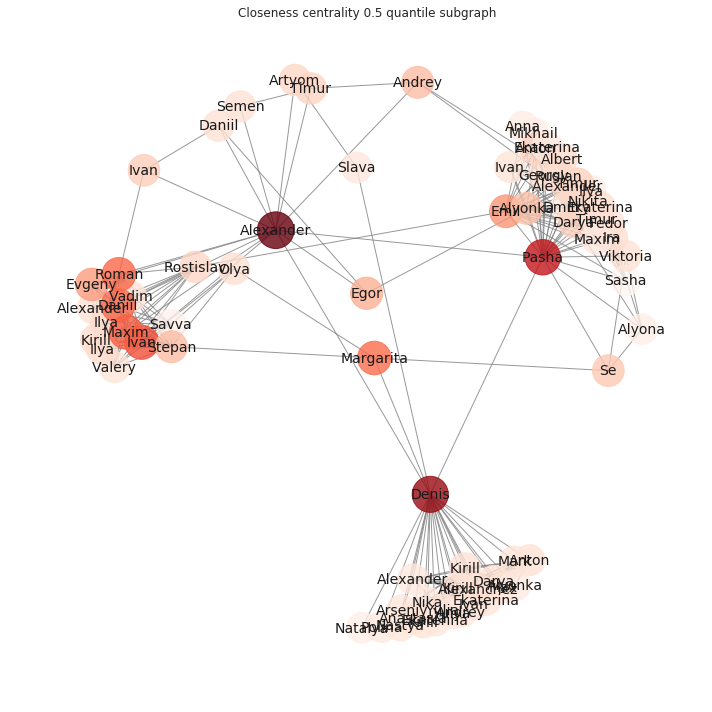

In [29]:
subgraph_top, sub_measures = get_top_subgraph(subgraph, cm)

plt.figure(1, figsize=SMALL_GRAPH_PLOT_SIZE)
draw_centralities(subgraph_top, sub_measures, k_mult=3, pos=pos, size_mult=3000)
plt.title('Closeness centrality 0.5 quantile subgraph')
plt.tight_layout()
plt.savefig('pics/struct_closeness_top.png')
plt.show()

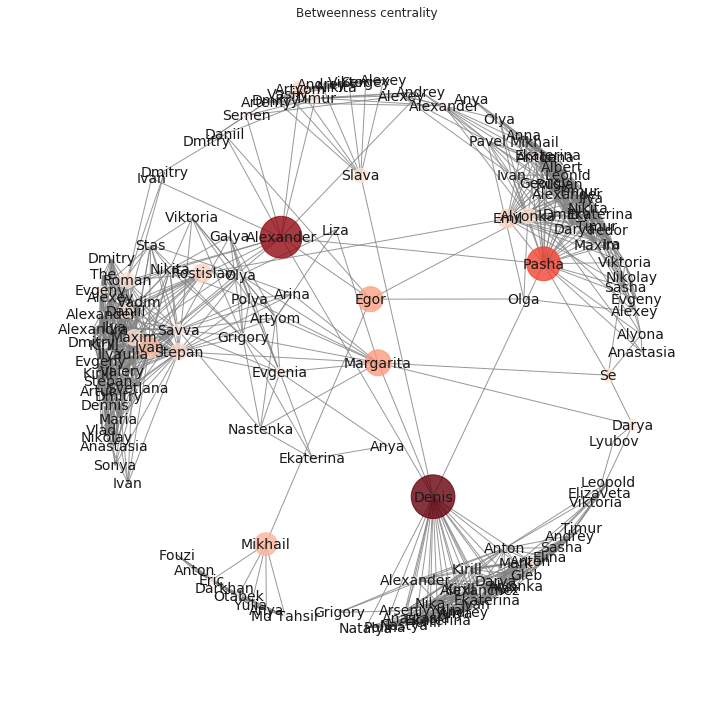

In [30]:
bc = nx.betweenness_centrality(subgraph)
plt.figure(1, figsize=SMALL_GRAPH_PLOT_SIZE)
draw_centralities(subgraph, bc, pos=pos)
plt.title('Betweenness centrality')
plt.tight_layout()
plt.savefig('pics/struct_bt.png')
plt.show()

/home/boris/anaconda3/envs/py2/lib/python2.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  
/home/boris/anaconda3/envs/py2/lib/python2.7/site-packages/ipykernel_launcher.py:7: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  import sys


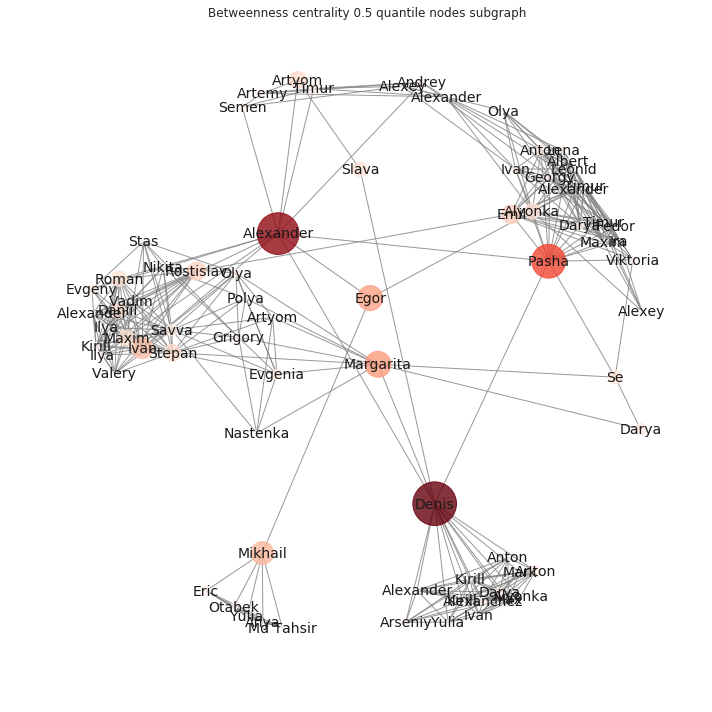

In [31]:
subgraph_top, sub_measures = get_top_subgraph(subgraph, bc, quantile=0.5)

plt.figure(1, figsize=SMALL_GRAPH_PLOT_SIZE)
draw_centralities(subgraph_top, sub_measures, k_mult=3, pos=pos)
plt.title('Betweenness centrality 0.5 quantile nodes subgraph')
plt.tight_layout()
plt.savefig('pics/struct_bt_top.png')
plt.show()

In [32]:
top = pd.Series(bc).nlargest(5)
top_nodes = np.array(top.index)
print 'Top 5 nodes'
for n in top_nodes:
    print labels[n], round(top[n], 4)

Top 5 nodes
Denis 0.3823
Alexander 0.3494
Pasha 0.2288
Margarita 0.1342
Egor 0.1257


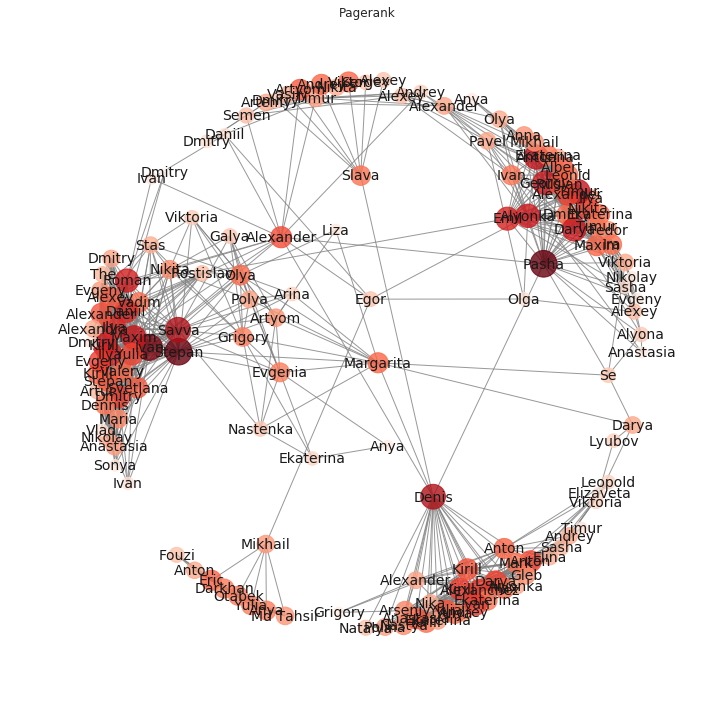

In [33]:
pr = nx.pagerank(subgraph)
plt.figure(1, figsize=SMALL_GRAPH_PLOT_SIZE)
draw_centralities(subgraph, pr, pos=pos, size_mult=50000)
plt.title('Pagerank')
plt.tight_layout()
plt.savefig('pics/struct_pr.png')
plt.show()

In [34]:
pd.Series(pr.values()).describe()

count    149.000000
mean       0.006711
std        0.002676
min        0.001703
25%        0.004663
50%        0.006294
75%        0.008446
max        0.014254
dtype: float64

In [35]:
top = pd.Series(pr).nlargest(5)
top_nodes = np.array(top.index)
print 'Top 5 nodes'
for n in top_nodes:
    print labels[n], round(top[n], 4)

Top 5 nodes
Pasha 0.0143
Stepan 0.0142
Ivan 0.0137
Savva 0.0124
Denis 0.0123


/home/boris/anaconda3/envs/py2/lib/python2.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  
/home/boris/anaconda3/envs/py2/lib/python2.7/site-packages/ipykernel_launcher.py:7: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  import sys


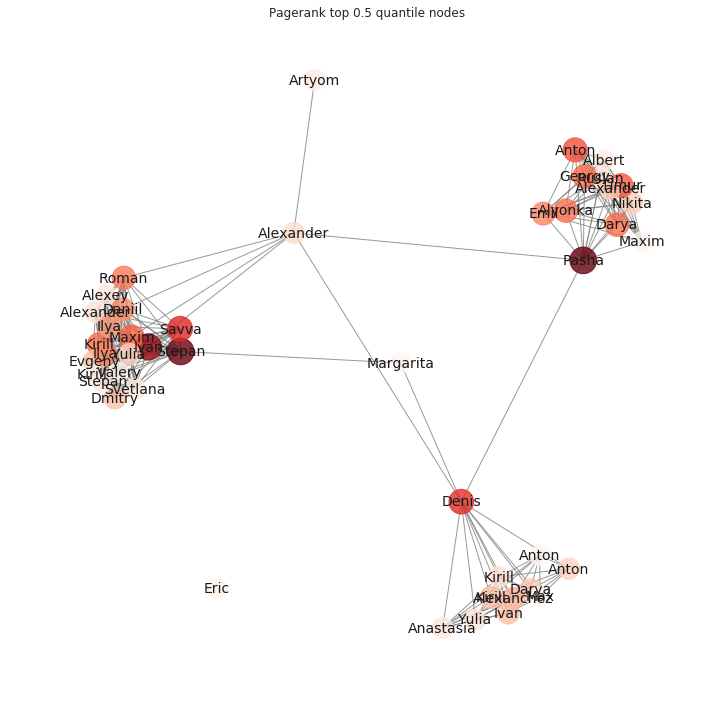

In [36]:
subgraph_top, sub_measures = get_top_subgraph(subgraph, pr, quantile=0.7)

plt.figure(1, figsize=SMALL_GRAPH_PLOT_SIZE)
draw_centralities(subgraph_top, sub_measures, k_mult=3, pos=pos, size_mult=50000)
plt.title('Pagerank top 0.5 quantile nodes')
plt.tight_layout()
plt.savefig('pics/struct_pr_top.png')
plt.show()

In [37]:
## Assortative mixing

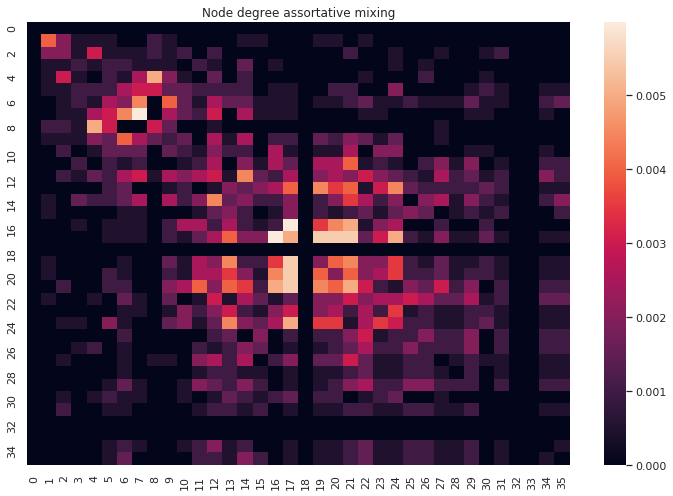

Node degree assortativity 0.3152164463520887


In [38]:
mixing_matrix = nx.degree_mixing_matrix(graph)
plt.figure(1, figsize=PLOT_SIZE)
sns.heatmap(mixing_matrix)
plt.title('Node degree assortative mixing')
plt.tight_layout()
plt.savefig('pics/struct_assort_mixing_matrix.png')
plt.show()
print 'Node degree assortativity', nx.degree_assortativity_coefficient(graph)

In [39]:
graph.node[0].keys()

['city', 'first_name', 'bdate', 'label', 'id', 'sex']

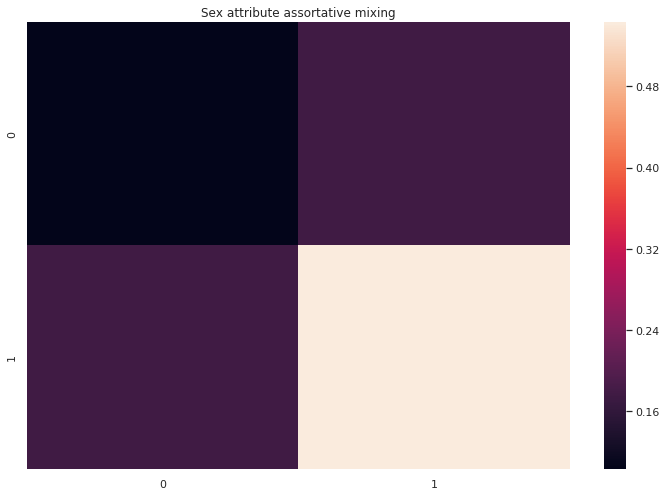

Sex attribute assortativity 0.12118618001


In [40]:
mixing_matrix = nx.attribute_mixing_matrix(graph, 'sex')
plt.figure(1, figsize=PLOT_SIZE)
sns.heatmap(mixing_matrix)
plt.title('Sex attribute assortative mixing')
plt.tight_layout()
plt.savefig('pics/struct_assort_sex_mixing_matrix.png')
plt.show()
print 'Sex attribute assortativity', nx.attribute_assortativity_coefficient(graph, 'sex')

In [41]:
years = nx.get_node_attributes(graph, 'bdate')
years_clean = {}
for k,v in years.items():
    new_v = None
    if new_v != 'None':
        split = v.split('.')
        if len(split) == 3:
            new_v = int(split[-1])
    years_clean[k] = new_v
    
nx.set_node_attributes(graph, 'birth_year', years_clean)

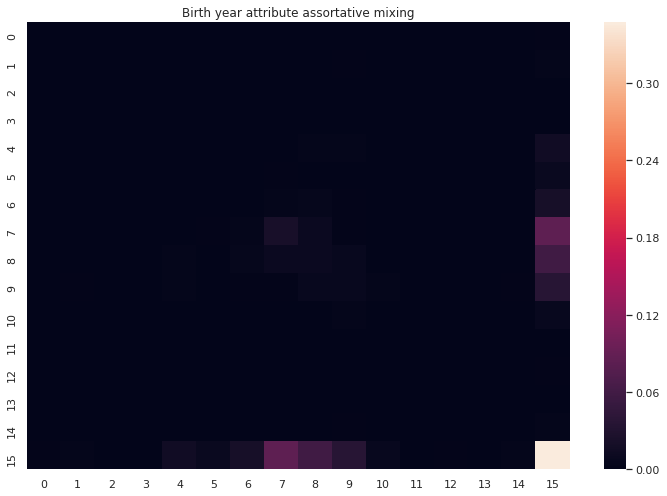

Birth year attribute assortativity 0.00936153687455


In [42]:
mixing_matrix = nx.attribute_mixing_matrix(graph, 'birth_year')
plt.figure(1, figsize=PLOT_SIZE)
sns.heatmap(mixing_matrix)
plt.title('Birth year attribute assortative mixing')
plt.tight_layout()
#plt.savefig('pics/struct_assort_byear_mixing_matrix.png')
plt.show()
print 'Birth year attribute assortativity', nx.attribute_assortativity_coefficient(graph, 'birth_year')

In [43]:
mixing_matrix

array([[0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.000499  ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.00249501],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.000998  , 0.        , 0.000998  , 0.00149701,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.00399202],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.000499  , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.000499  , 0.        , 0.        , 0.        , 0.        ,
        0.000499  ],
       [0.        , 0.        , 0.        , 0.        , 0.000998  ,
        0.        , 0.000499  , 

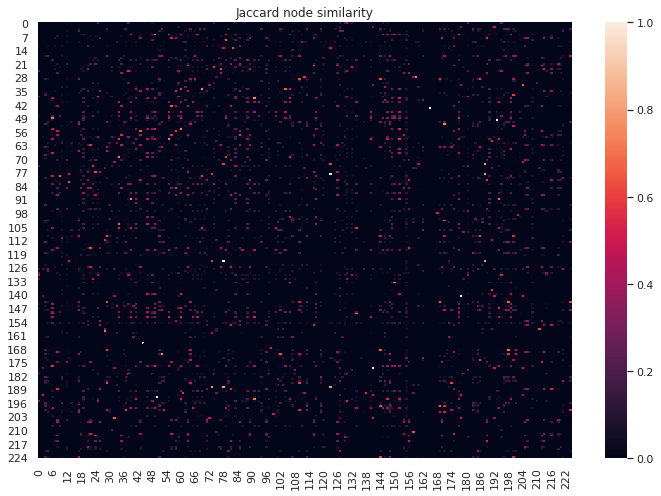

In [44]:
# Jaccard node similarity matrix 
jaccard = list(nx.jaccard_coefficient(graph))
matrix_size = jaccard[-1][1]
matrix = np.zeros((matrix_size+1, matrix_size+1))
for x, y, v in jaccard:
    matrix[x][y] = v
    matrix[y][x] = v

plt.figure(1, figsize=PLOT_SIZE)
sns.heatmap(matrix)
plt.title('Jaccard node similarity')
plt.tight_layout()
plt.savefig('pics/struct_jaccard_matrix.png')
plt.show()

In [45]:
names = nx.get_node_attributes(graph, 'first_name')

In [46]:
top_similar = pd.DataFrame(sorted(jaccard, key=lambda x: -x[2]), columns=['node1','node2','similarity'])
top_similar.head(10)

,node1,node2,similarity
0,44,165,1.000000
1,50,193,1.000000
2,78,123,1.000000
3,141,178,1.000000
4,73,188,0.800000
5,78,188,0.800000
6,123,188,0.800000
7,52,171,0.764706
8,39,91,0.750000
9,34,69,0.740741


In [47]:
top_similar['node1_name'] = top_similar.node1.apply(lambda x: names[x])
top_similar['node2_name'] = top_similar.node2.apply(lambda x: names[x])
top_similar.head()

,node1,node2,similarity,node1_name,node2_name
0,44,165,1.0,Misha,Ilya
1,50,193,1.0,Diana,Anna
2,78,123,1.0,Dmitry,Sergey
3,141,178,1.0,Artem,Maria
4,73,188,0.8,Alexey,Vasily


/home/boris/anaconda3/envs/py2/lib/python2.7/site-packages/numpy/lib/function_base.py:2530: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/home/boris/anaconda3/envs/py2/lib/python2.7/site-packages/numpy/lib/function_base.py:2531: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


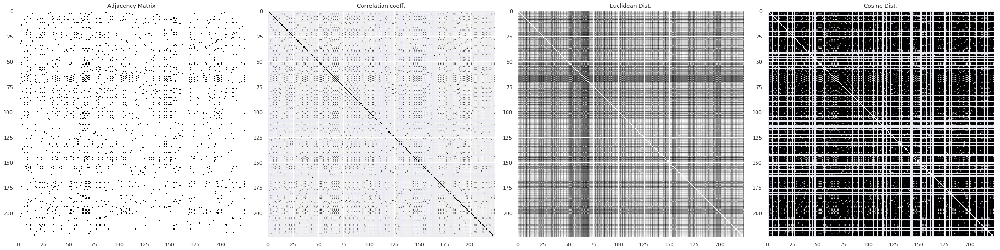

In [48]:
import scipy.spatial as spt
A = nx.to_numpy_matrix(graph, dtype=int)
A = np.asarray(A)

def plotDist(A):
    
    f, ax = plt.subplots(1, 4, figsize=(30, 10))
    ax[0].imshow(A, cmap = 'Greys', interpolation = 'None')
    ax[0].set_title('Adjacency Matrix')
    
    D = np.corrcoef(A)
    ax[1].imshow(D, cmap = 'Greys', interpolation = 'None')
    ax[1].set_title('Correlation coeff.')
    
    dVec = spt.distance.pdist(A, metric = 'euclidean')
    D = spt.distance.squareform(dVec)
    ax[2].imshow(D, cmap = 'Greys', interpolation = 'None')
    ax[2].set_title('Euclidean Dist.')
    
    dVec = spt.distance.pdist(A, metric = 'cosine')
    D = spt.distance.squareform(dVec)
    ax[3].imshow(D, cmap = 'Greys', interpolation = 'None')
    ax[3].set_title('Cosine Dist.')


plotDist(A)   
plt.tight_layout()
plt.savefig('pics/struct_distances.png')
plt.show()

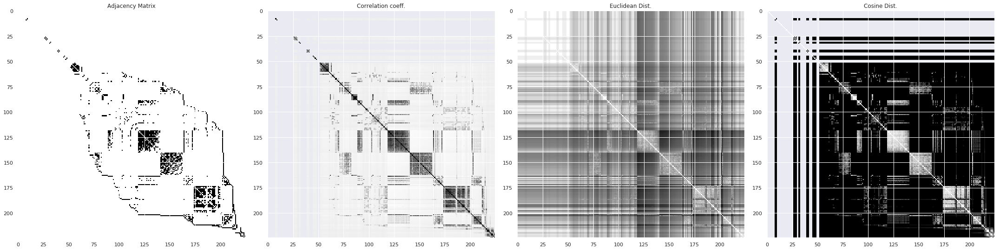

In [49]:
# run procedure
cm = nx.utils.reverse_cuthill_mckee_ordering(graph)
# get permutation
l = [n for n in cm]
l

A = nx.to_numpy_matrix(graph)
A = np.asarray(A)
# apply reordering
A = A[np.ix_(l,l)]

plotDist(A)   
plt.tight_layout()
plt.savefig('pics/struct_distances_cuthill.png')
plt.show()

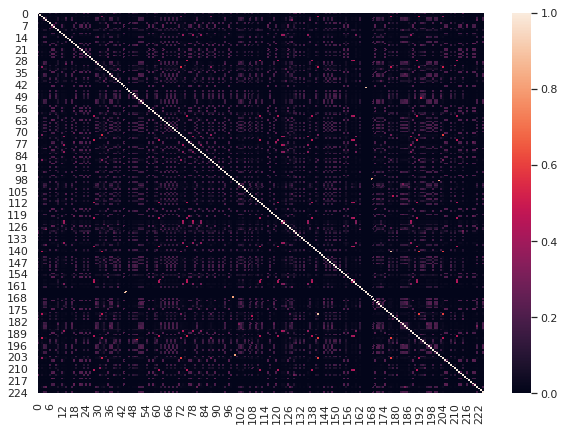

In [50]:
from collections import defaultdict
import copy
import sys
def simrank(G, c=0.9, max_iter=100, remove_neighbors=False, remove_self=False, dump_process=False):
  if type(G) == nx.MultiGraph or type(G) == nx.MultiDiGraph:
    raise Exception("simrank() not defined for graphs with multiedges.")

  if G.is_directed():
    raise Exception("simrank() not defined for directed graphs.")

  sim_old = defaultdict(list)
  sim = defaultdict(list)
  for n in G.nodes():
    sim[n] = defaultdict(int)
    sim[n][n] = 1
    sim_old[n] = defaultdict(int)
    sim_old[n][n] = 0

  # calculate simrank
  for iter_ctr in range(max_iter):
    if _is_converge(sim, sim_old):
      break
    sim_old = copy.deepcopy(sim)
    for i, u in enumerate(G.nodes()):
      if dump_process:
        sys.stdout.write("\r%d : % d / %d" % (iter_ctr, i, G.number_of_nodes()))
      for v in G.nodes():
        if u == v:
          continue
        s_uv = 0.0
        for n_u in G.neighbors(u):
          for n_v in G.neighbors(v):
            s_uv += sim_old[n_u][n_v]
        sim[u][v] = (c * s_uv / (len(G.neighbors(u)) * len(G.neighbors(v)))) \
            if len(G.neighbors(u)) * len(G.neighbors(v)) > 0 else 0
    if dump_process:
      print ''

  if remove_self:
    for m in G.nodes():
      G[m][m] = 0

  if remove_neighbors:
    for m in G.nodes():
      for n in G.neighbors(m):
        sim[m][n] = 0

  return sim

def _is_converge(s1, s2, eps=1e-4):
  for i in s1.keys():
    for j in s1[i].keys():
      if abs(s1[i][j] - s2[i][j]) >= eps:
        return False
  return True

# Simrank node similarity matrix 
matrix = pd.DataFrame(simrank(graph))
plt.figure(1, figsize=(10,7))
sns.heatmap(matrix)
plt.show()

## Closest random model to my network

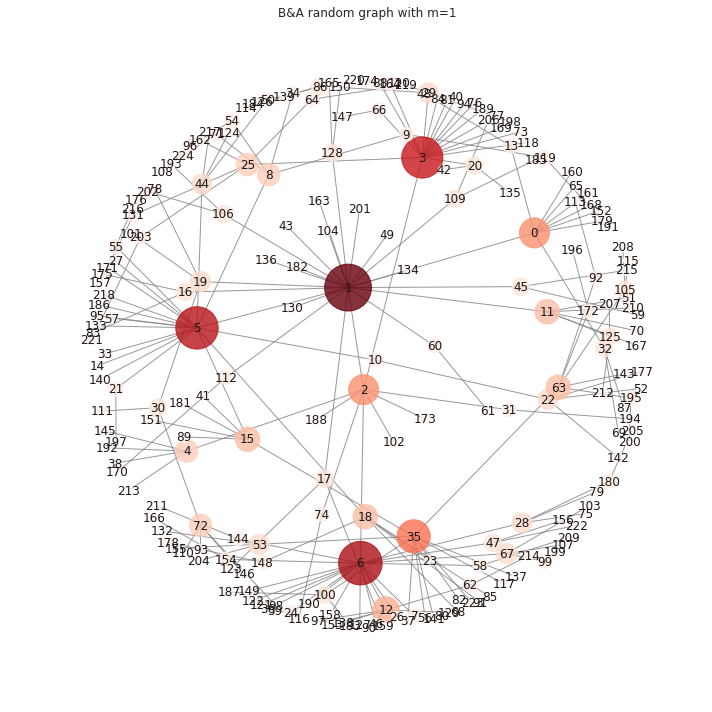

In [51]:
# Barabasi Albert with m=1 is pretty close to my graph
g = nx.barabasi_albert_graph(graph.order(), 1)
subgraph = g
degree = nx.degree(subgraph)
plt.figure(1, figsize=SMALL_GRAPH_PLOT_SIZE)
plt.axis('off')
pos = nx.spring_layout(subgraph, k=1/np.sqrt(subgraph.order()))
nx.draw_networkx(subgraph,
                 pos=pos,
                 node_size = [d*100 for k, d in degree.items()],
                 node_color=degree.values(),
                 font_size=12,
                 cmap=plt.cm.Reds,
                 with_labels=True,
                 edge_color='grey',
                 alpha=0.8)
plt.title("B&A random graph with m=1")
plt.tight_layout()
plt.savefig('pics/struct_random_model.png')
plt.show()

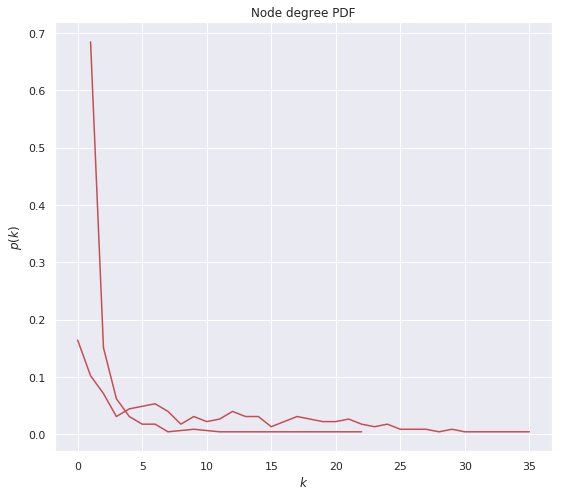

In [52]:
plt.figure(figsize=PLOT_SIZE_WIDE)
plt.subplot(1,2,1)
plot_pdf(graph)
plot_pdf(g)
# plt.subplot(1,2,2)
# plot_pdf(graph)
# plot_cdf(g)
plt.tight_layout()
#plt.savefig('pics/struct_degree_dist_random.png')
plt.show()

## K-cores

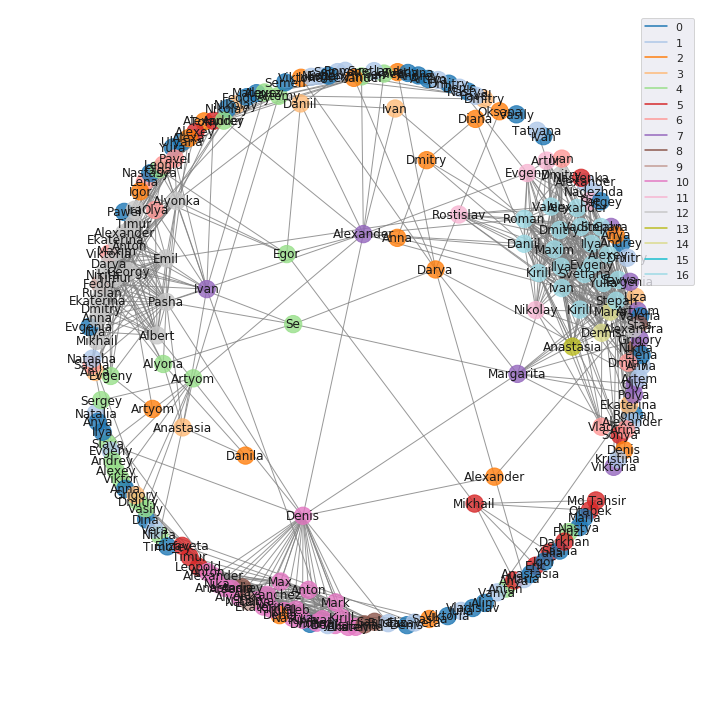

In [53]:
def draw_categorized(graph, cvals):
    labels = nx.get_node_attributes(graph, 'first_name')
    cmap = plt.get_cmap('tab20')
    vmin = min(cvals)
    vmax = max(cvals)
    c_norm = colors.Normalize(vmin=vmin, vmax=vmax)
    scalar_map = cmx.ScalarMappable(norm=c_norm, cmap=cmap)
    color_legend = {str(i): i for i in range(min(cvals), max(cvals)+1)}
    for clabel in sorted(color_legend.keys(), key=lambda x: (len(x), x)):
        plt.plot([0],[0], color=scalar_map.to_rgba(color_legend[clabel]),label=clabel)

    plt.axis('off')
    pos = nx.spring_layout(graph, k=2/np.sqrt(graph.order()))
    nx.draw_networkx(graph,
                     pos=pos,
                     node_color=cvals,
                     cmap=cmap,
                     vmin=vmin,
                     vmax=vmax,
                     font_size=12,
                     with_labels=True,
                     labels=labels,
                     edge_color='grey',
                     alpha=0.8)

    plt.legend()
    
def draw_kcore(graph): 
    core_num = nx.core_number(graph)
    cvals = core_num.values()

    draw_categorized(graph, cvals)

plt.figure(figsize=SMALL_GRAPH_PLOT_SIZE)
#plt.title("k-cores")
draw_kcore(graph)
plt.tight_layout()
plt.savefig('pics/com_kcore.png')
plt.show()

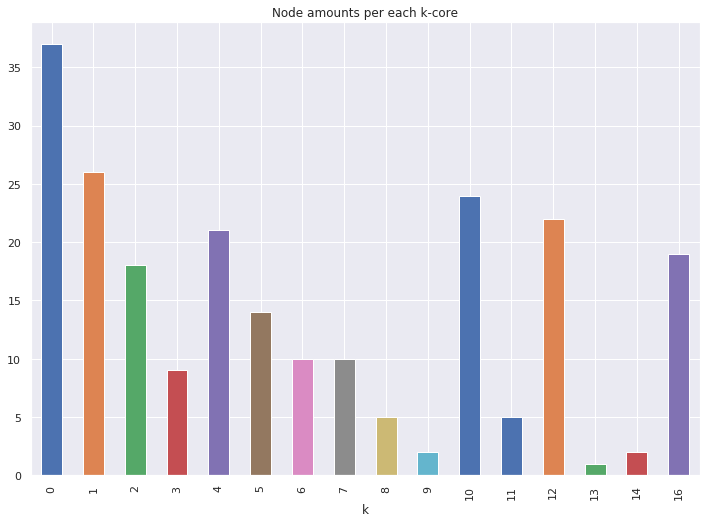

In [54]:
core_bars = pd.Series(nx.core_number(graph)).value_counts()
#core_bars.index = np.array(core_bars.index)

plt.figure(figsize=PLOT_SIZE)
core_bars.sort_index().plot.bar()
plt.tight_layout()
plt.title('Node amounts per each k-core')
plt.savefig('pics/com_kcore_bar.png')
plt.xlabel('k')
plt.show()

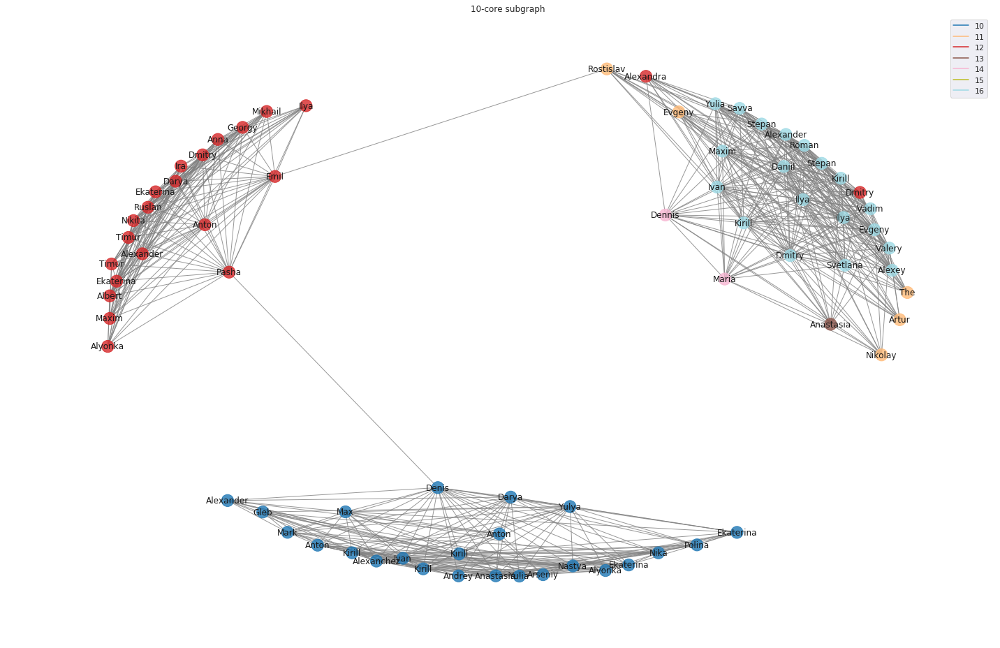

In [55]:
plt.figure(figsize=GRAPH_PLOT_SIZE)
plt.title("10-core subgraph")
subgraph = nx.k_core(graph, 10)
draw_kcore(subgraph)

plt.tight_layout()
plt.savefig('pics/com_kcore_10.png')
plt.show()

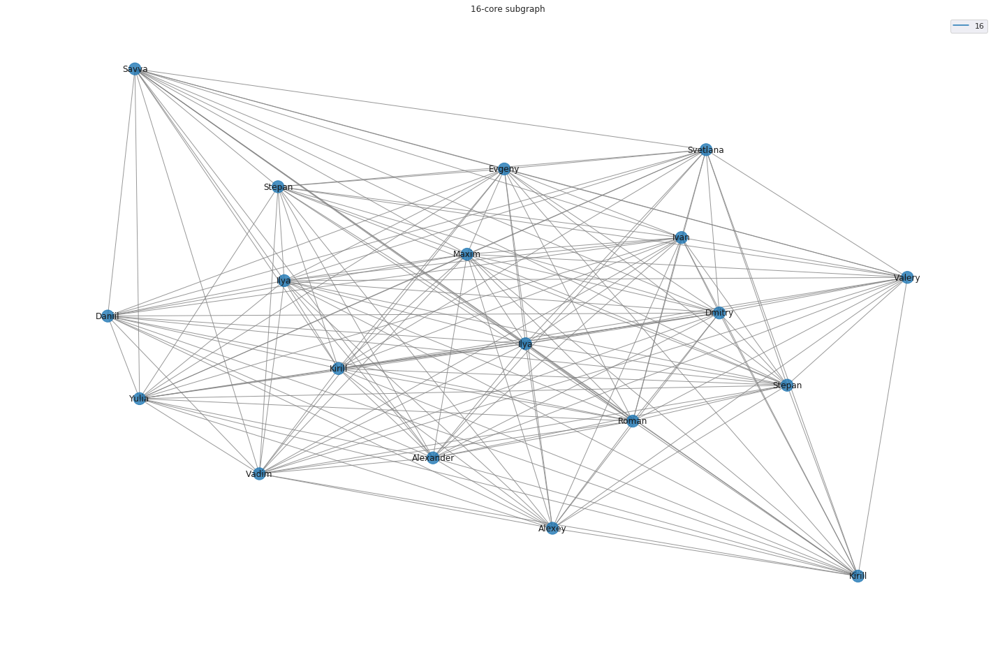

In [56]:
plt.figure(figsize=GRAPH_PLOT_SIZE)
plt.title("16-core subgraph")
subgraph = nx.k_core(graph, 16)
draw_kcore(subgraph)

plt.tight_layout()
plt.savefig('pics/com_kcore_16.png')
plt.show()

# Maximum cliques

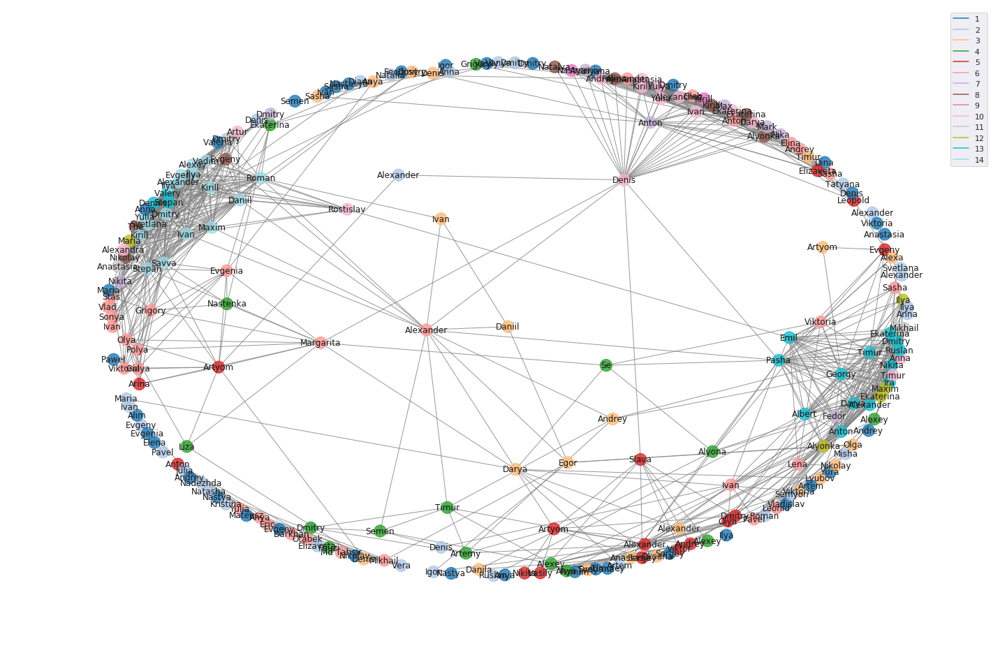

In [57]:
def draw_cliques(graph): 
    node_clique_number = nx.node_clique_number(graph)
    cvals = node_clique_number.values()

    draw_categorized(graph, cvals)
   
plt.figure(figsize=GRAPH_PLOT_SIZE)
draw_cliques(graph)
plt.tight_layout()
plt.savefig('pics/com_clique.png')
plt.show()

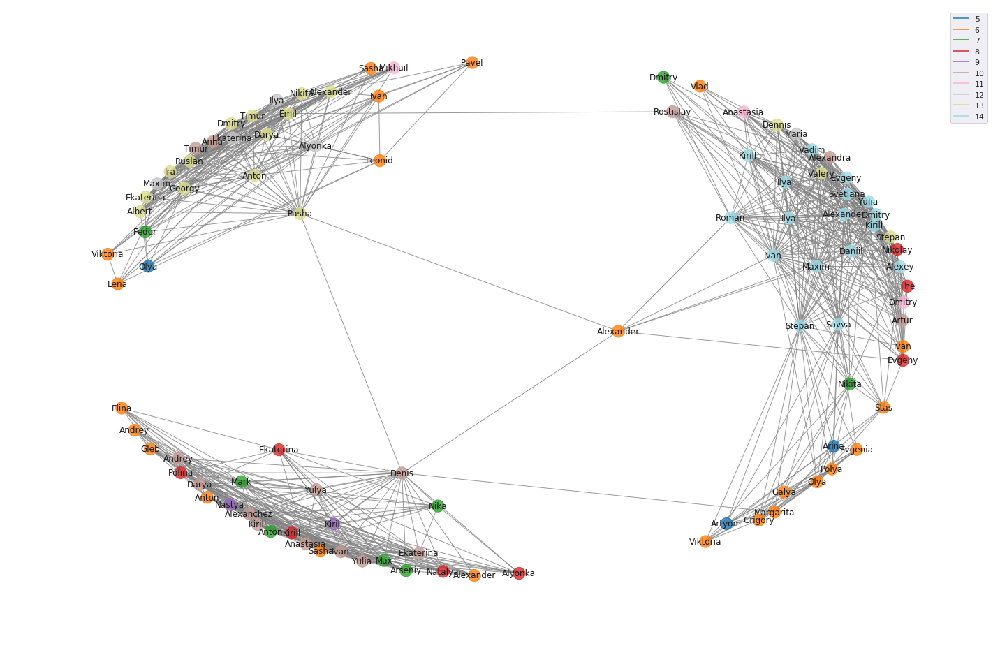

In [58]:
plt.figure(figsize=GRAPH_PLOT_SIZE)
draw_cliques(nx.k_core(graph, 6))
plt.tight_layout()
plt.savefig('pics/com_clique_kcore.png')
plt.show()

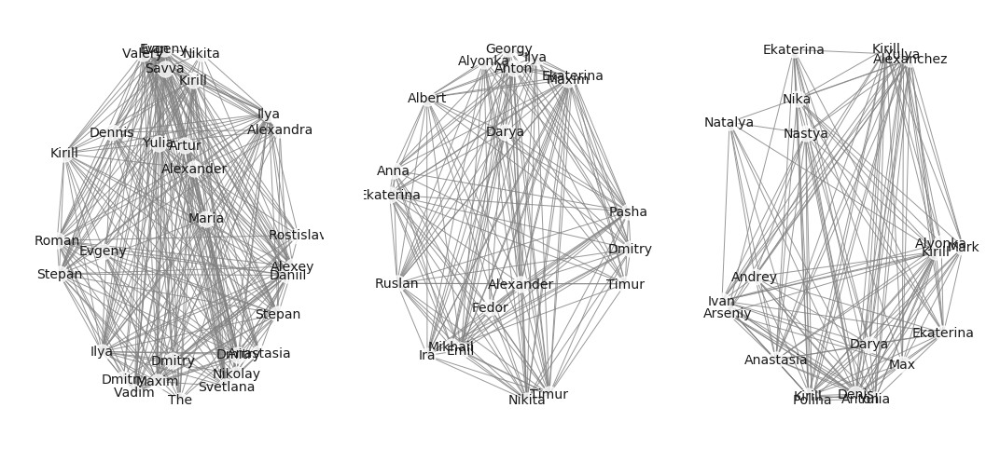

In [59]:
communities = list(nx.k_clique_communities(graph, 7))

plt.figure(figsize=PLOT_SIZE_WIDE)

i = 1
for c_nodes in communities:
    c_subgraph = nx.subgraph(graph, c_nodes)
    
    labels = get_labels(c_subgraph)
    plt.subplot(1, len(communities), i)
    plt.axis('off')
    pos = pos or nx.spring_layout(c_subgraph, k=2/np.sqrt(c_subgraph.order()))
    nx.draw_networkx(c_subgraph,
                     pos=pos,
                     font_size=14,
                     cmap=plt.cm.Reds,
                     node_color='white',
                     with_labels=True,
                     labels=labels,
                     edge_color='grey',
                     alpha=0.8)
    i+=1

plt.savefig('pics/com_klique_communities_.png')
plt.tight_layout()
plt.show()

In [60]:
import cylouvain

Modularity 0.701



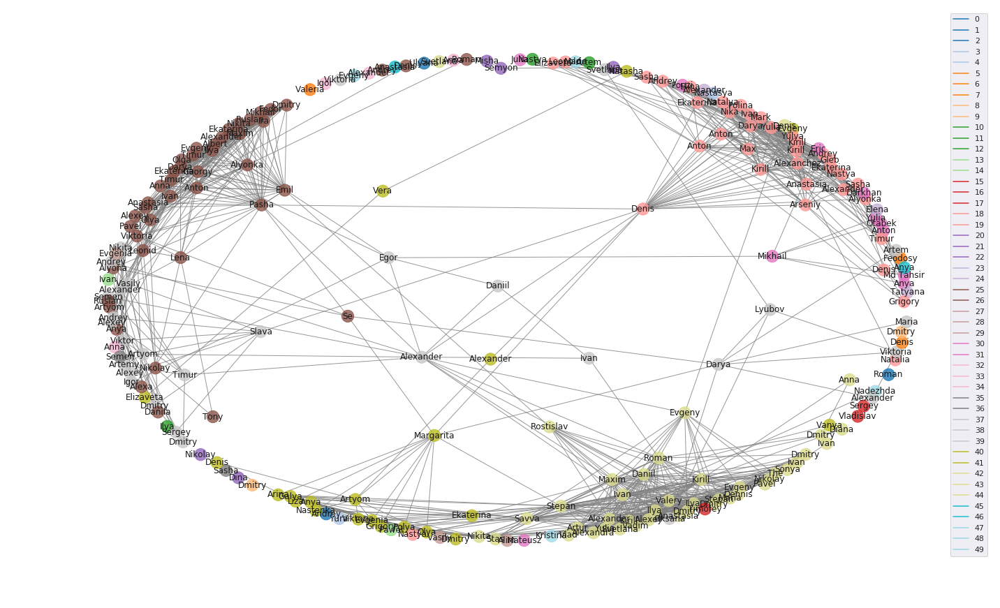

In [95]:
plt.figure(figsize=GRAPH_PLOT_SIZE)


partition = cylouvain.best_partition(graph)

modularity = cylouvain.modularity(partition, graph)
print("Modularity %0.3f\n" % modularity)

cvals = partition.values()

draw_categorized(graph, cvals)
plt.tight_layout()
plt.savefig('pics/com_louvain.png')
plt.show()

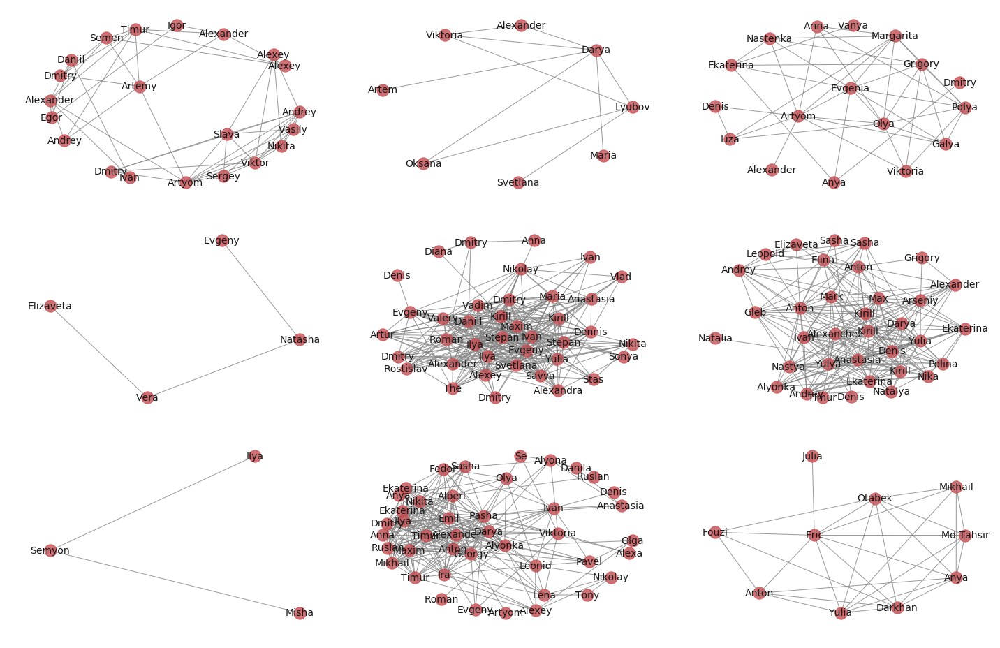

In [94]:
import math
plt.figure(figsize=GRAPH_PLOT_SIZE)

    
partition = cylouvain.best_partition(graph)
unique_coms = list(set(partition.values()))

com_dict = {}
for com in unique_coms:
    c_nodes = [k for k in partition if partition[k] == com]
    if len(c_nodes) <= 2:
        continue
    com_dict[com] = c_nodes

i = 1
for com, c_nodes in com_dict.items():
    plt.subplot(3, math.ceil(len(com_dict.keys())/3.0), i)
    c_subgraph = nx.subgraph(graph, c_nodes)
    
    labels = get_labels(c_subgraph)
    plt.axis('off')
    pos = nx.spring_layout(c_subgraph, k=2/np.sqrt(c_subgraph.order()))
    nx.draw_networkx(c_subgraph,
                     pos=pos,
                     font_size=14,
                     cmap=plt.cm.Reds,
                     with_labels=True,
                     labels=labels,
                     edge_color='grey',
                     alpha=0.8)
    i+=1
plt.tight_layout()
plt.savefig('pics/com_louvain_coms.png')
plt.show()

Modularity 0.693



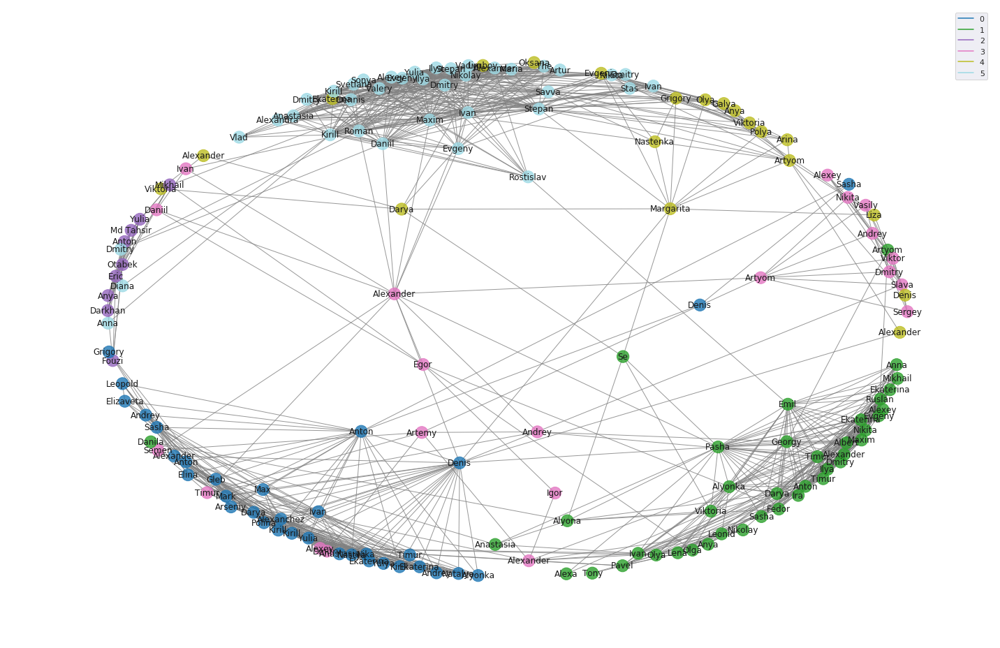

In [93]:
plt.figure(figsize=GRAPH_PLOT_SIZE)

subgraph = nx.k_core(graph, 2)

partition = cylouvain.best_partition(subgraph)

modularity = cylouvain.modularity(partition, subgraph)
print("Modularity %0.3f\n" % modularity)

cvals = partition.values()
draw_categorized(subgraph, cvals)

plt.tight_layout()
plt.savefig('pics/com_louvain_kcore.png')
plt.show()

Using a combination of k-core and louvain methods we obtain nearly perfect partitioning into communities

Modularity 0.697



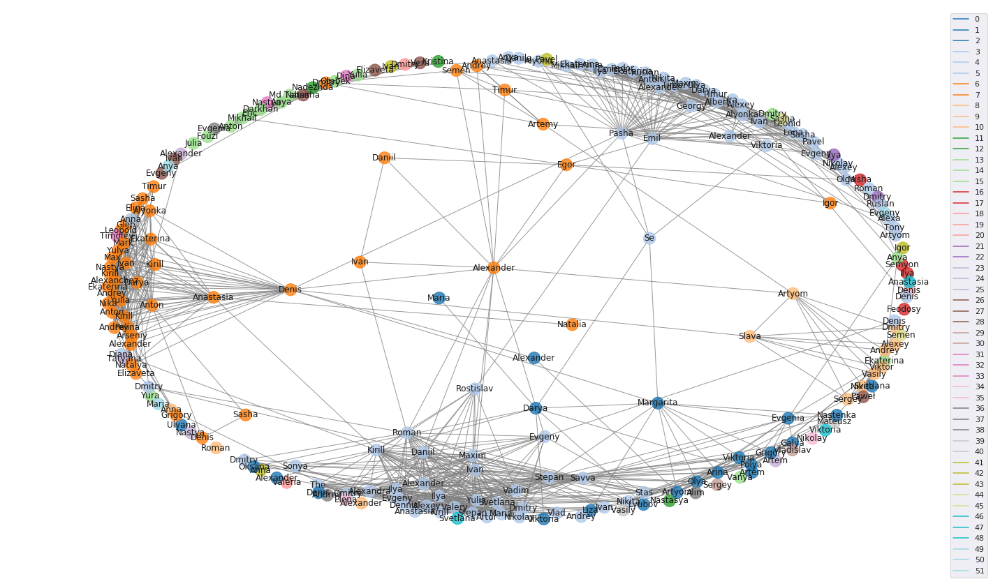

In [97]:
def walktrap(g):
    #ig_graph = ig.Graph.TupleList(g.edges(), directed=False)
    ig_graph = ig.Graph.Adjacency((nx.to_numpy_matrix(g) > 0).tolist())
    clusters = ig_graph.community_walktrap()

    cvals = clusters.as_clustering().membership
    return cvals

plt.figure(figsize=GRAPH_PLOT_SIZE)
cvals = walktrap(graph)
partition = dict(zip(graph.nodes(), cvals))
modularity = cylouvain.modularity(partition, graph)
print("Modularity %0.3f\n" % modularity)

draw_categorized(graph, cvals)
plt.tight_layout()
plt.savefig('pics/coms_walktrap.png')
plt.show()


Modularity 0.688



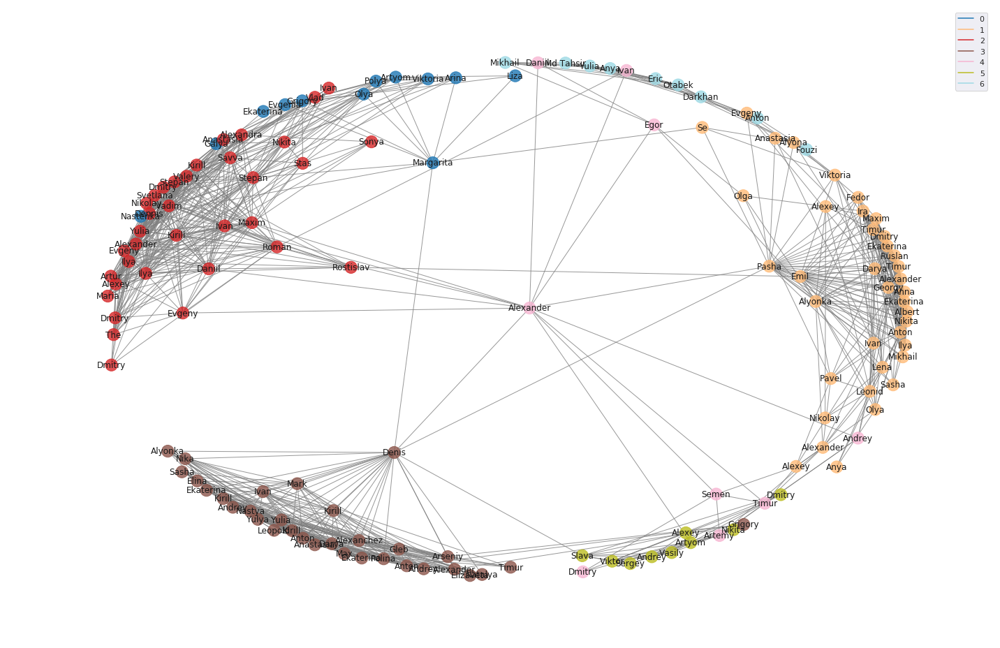

In [101]:
subgraph = nx.k_core(graph, 3)
plt.figure(figsize=GRAPH_PLOT_SIZE)
cvals = walktrap(subgraph)
partition = dict(zip(subgraph.nodes(), cvals))
modularity = cylouvain.modularity(partition, subgraph)
print("Modularity %0.3f\n" % modularity)
draw_categorized(subgraph, cvals)
plt.tight_layout()
plt.savefig('pics/coms_walktrap_3core.png')
plt.show()

11


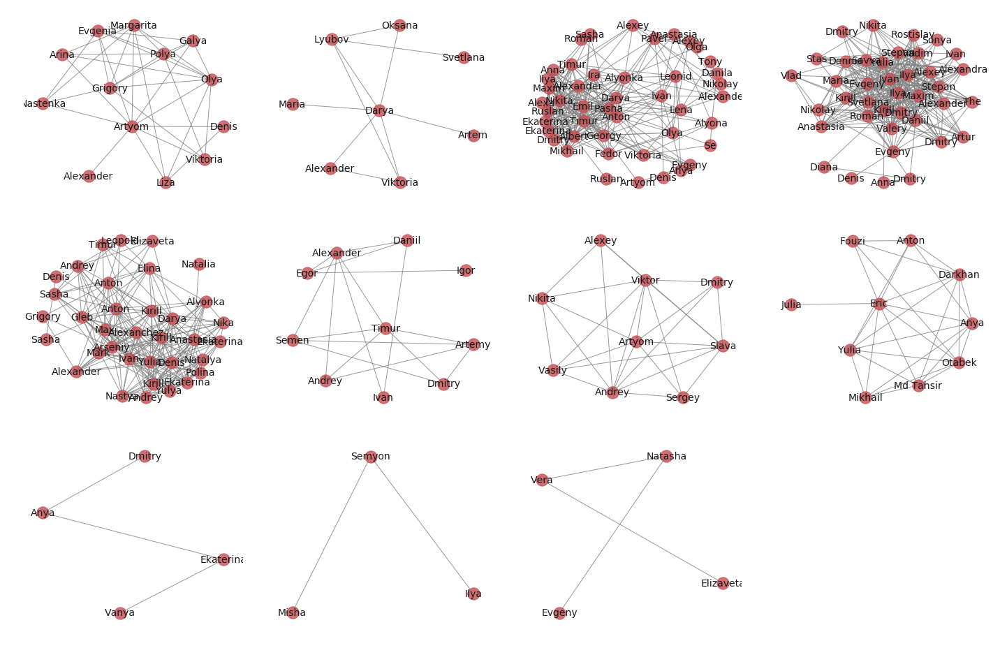

In [107]:
plt.figure(figsize=GRAPH_PLOT_SIZE)

    
partition = dict(zip(graph.nodes(), walktrap(graph)))
unique_coms = list(set(partition.values()))

com_dict = {}
for com in unique_coms:
    c_nodes = [k for k in partition if partition[k] == com]
    if len(c_nodes) <= 2:
        continue
    com_dict[com] = c_nodes

i = 1
print(len(com_dict.keys()))
for com, c_nodes in com_dict.items():
    plt.subplot(3, math.ceil(len(com_dict.keys())/3.0), i)
    c_subgraph = nx.subgraph(graph, c_nodes)
    
    labels = get_labels(c_subgraph)
    plt.axis('off')
    pos = nx.spring_layout(c_subgraph, k=2/np.sqrt(c_subgraph.order()))
    nx.draw_networkx(c_subgraph,
                     pos=pos,
                     font_size=14,
                     cmap=plt.cm.Reds,
                     with_labels=True,
                     labels=labels,
                     edge_color='grey',
                     alpha=0.8)
    i+=1
plt.tight_layout()
plt.savefig('pics/com_walktrap_comms.png')
plt.show()